<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

### **Assignment 2: Machine Learning in Hyperspectral Imagery**  
**Author: Ramesh Bhatta, CIS, RIT**  
**Github Repo: https://github.com/Bhatta6190/Machine-Learning-in-Remote-Sensing.git**  

*Note: This notebook contains all the problem definition, the code block solution for each problems and the relevant explanation of results as required in a step-by-step manner.*
</div>

In [101]:
## Importing Necessary Packages

import numpy as np
import spectral
import seaborn as sns
from itertools import islice
import matplotlib.pyplot as plt
import spectral.io.envi as envi

In [102]:
## Predefined plot preferences

# Define text sizes
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

# Apply text size settings
plt.rc('font', size=SMALL_SIZE)          # Default font size
plt.rc('axes', titlesize=MEDIUM_SIZE)   # Axis title font size
plt.rc('axes', labelsize=MEDIUM_SIZE)   # Axis labels font size
plt.rc('xtick', labelsize=SMALL_SIZE)   # X-axis tick label font size
plt.rc('ytick', labelsize=SMALL_SIZE)   # Y-axis tick label font size
plt.rc('legend', fontsize=SMALL_SIZE)   # Legend font size
plt.rc('figure', titlesize=BIGGER_SIZE) # Figure title font size

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---
---

### **Problem 1: Hyperspectral Data**  

Last week, you worked with Sentinel-2 multispectral data. This week, you will analyze hyperspectral data collected by the RIT MX1 drone over the RIT Tait Reserve area. The dataset is provided as `taitlabsphere` and `taitlabsphere.hdr`.  

This is an ENVI headered file, which includes a corresponding metadata file (`.hdr`). The header file describes various aspects of the dataset, such as the coordinate system, number of lines and columns, number of spectral bands, and more. Read through the `.hdr` file to familiarize yourself with the metadata structure. You can also find the wavelengths for each spectral band within the header file.  

---  

**(1.a) (10 points)** 
Load the data using the Spectral Python (SPy) and `envi` module, select and plot one band from the blue, green, and red regions of the spectrum. Additionally, create a pseudocolor image using bands from the green, red, and near-infrared (NIR) regions.  

**Solution:**  
Put your solution here  

---

</div>

In [103]:
## a. Loading the Hyperspectral Image Data

hsi_data = envi.open("./materials/tait_hsi.hdr", "./materials/tait_hsi")

In [104]:
## b. Hyperspectral Data Information:

metadata = hsi_data.metadata

# Display all keys and a few sample values

print(f"\033[1mFirst 10 Bands Information:\033[0m \n")
for key, value in metadata.items():
    if isinstance(value, list): 
        sample_values = value[:10] 
    elif isinstance(value, str):  
        sample_values = value
    else:  
        sample_values = value

    print(f"{key}: {sample_values}")

## Remove nodata values from the data

hsi_image = hsi_data.load()
hsi_array = hsi_image.astype(np.float32)
mask = np.all(hsi_array == 0, axis=2)  # Mask if all bands values are 0 for a pixel
hsi_filtered = np.where(mask[:, :, None], np.nan, hsi_array)

First 10 Bands Information: 

description: /Volumes/Work/Teaching/App_ML_RS/ml_for_rs/hw2/tait_hsi
samples: 1087
lines: 1039
bands: 273
header offset: 0
file type: ENVI Standard
data type: 4
interleave: bsq
byte order: 0
map info: ['Geographic Lat/Lon', '1', '1', '-77.5058081182974', '43.1405659173375', '5.16255284796112e-07', '3.78053318295838e-07', 'WGS-84']
coordinate system string: ['GEOGCS["GCS_WGS_1984"', 'DATUM["D_WGS_1984"', 'SPHEROID["WGS_1984"', '6378137.0', '298.257223563]]', 'PRIMEM["Greenwich"', '0.0]', 'UNIT["Degree"', '0.0174532925199433]]']
band names: ['398.573 nm', '400.799 nm', '403.025 nm', '405.251 nm', '407.477 nm', '409.703 nm', '411.929 nm', '414.155 nm', '416.381 nm', '418.607 nm']


Selected Band Indices -> Blue: 23, Green: 68, Red: 113, NIR: 203


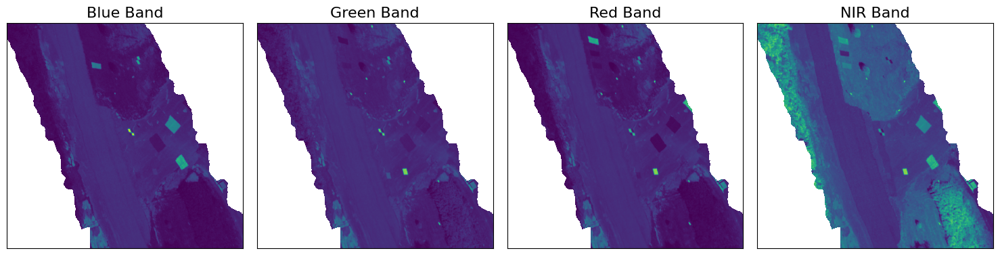

In [105]:
## c. Plotting the Individual R,G, B and NIR band image 

# Get all the wavelengths (numerical part only)
wavelengths = np.array([float(w.split()[0]) for w in metadata['band names']])

# Find closest bands to RGB wavelengths
blue_idx = np.argmin(np.abs(wavelengths - 450))  # Closest to 450 (blue) nm
green_idx = np.argmin(np.abs(wavelengths - 550))  # Closest to 550 (green) nm
red_idx = np.argmin(np.abs(wavelengths - 650))  # Closest to 650 (red) nm
nir_idx = np.argmin(np.abs(wavelengths - 850))   # NIR

print(f"Selected Band Indices -> Blue: {blue_idx}, Green: {green_idx}, Red: {red_idx}, NIR: {nir_idx}")

##  plotting the RGB image

# Function to normalize bands
def normalize_band(band):
    band_min = np.nanmin(band)
    band_max = np.nanmax(band)
    return (band - band_min) / (band_max - band_min) if band_max > band_min else band

# Extract and Normalize selected RGB Bands
red_band = normalize_band(hsi_filtered[:, :, red_idx])
green_band = normalize_band(hsi_filtered[:, :, green_idx])
blue_band = normalize_band(hsi_filtered[:, :, blue_idx])
nir_band = normalize_band(hsi_filtered[:, :, nir_idx])

## Plotting individual Blue, Green Red and NIR band.
fig, axes = plt.subplots(1, 4, figsize=(15, 7))

# List of images and titles
bands = [blue_band, green_band, red_band, nir_band]
titles = ["Blue Band", "Green Band", "Red Band", "NIR Band"]

for i, (band, title) in enumerate(zip(bands, titles)):
    axes[i].imshow(band)
    axes[i].set_title(title)
    axes[i].set_xticks([]) 
    axes[i].set_yticks([])
plt.tight_layout()  
plt.show()


<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

**COMMENTS:**

We can see from above plots of Blue, Green, Red and NIR bands that the particular targets highlighted by each band. Blue targets are highlighted and clearly visible in blue band image, and red targets in red band image. NIR band as it shows high reflectance for vegetation highlights them. However green band doesnt show much differentiation for vegetation, but shows for yellow and white target because of they reflect higher proportion of green light than vegetation.

</div>

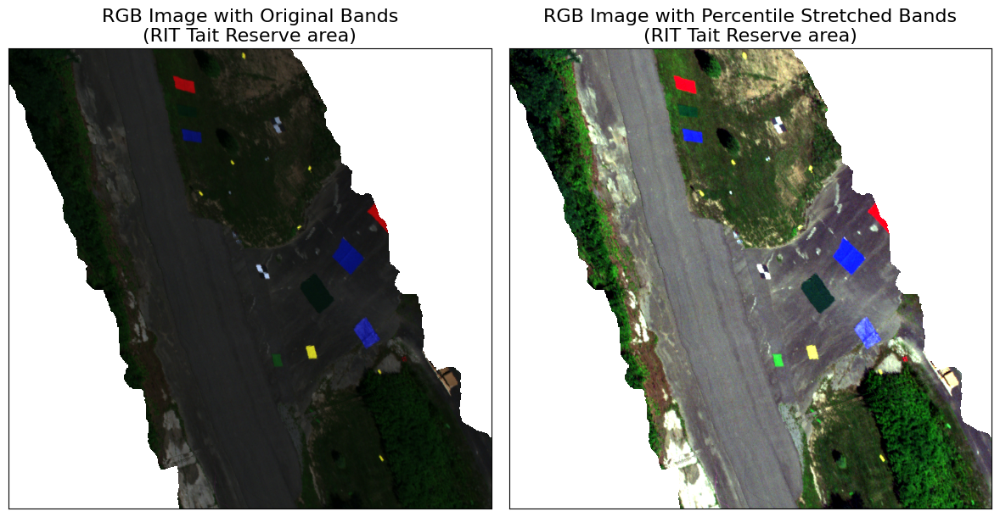

In [106]:
## d. Plotting RGB image

rgb_image = np.dstack([red_band, green_band, blue_band])

# Apply Percentile Stretching
def percentile_stretch(image, p_low=2, p_high=98):
    low, high = np.nanpercentile(image, (p_low, p_high))
    stretched = np.clip((image - low) / (high - low), 0, 1)
    return stretched

stretched_rgb = np.zeros_like(rgb_image, dtype=np.float32)
for i in range(3):  
    stretched_rgb[:, :, i] = percentile_stretch(rgb_image[:, :, i])

# Plot the RGB image and Percentile Stretched RGB Image
fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(rgb_image)
axes[0].set_title("RGB Image with Original Bands\n(RIT Tait Reserve area)")
axes[0].set_xticks([])  
axes[0].set_yticks([])
axes[1].imshow(stretched_rgb)
axes[1].set_title("RGB Image with Percentile Stretched Bands\n(RIT Tait Reserve area)")
axes[1].set_xticks([]) 
axes[1].set_yticks([])
plt.tight_layout()
plt.show()

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

**COMMENTS:**

Figure above shows the RGB image formed by stacking bands closest to Blue (450 nm), Green (550 nm) and Red (650 nm) bands. First figure shows the original image and second image shows the contrast stretched image which shows better visuals in term of details. All the pixels with zero band values are *flagged as NAN* values.

</div>

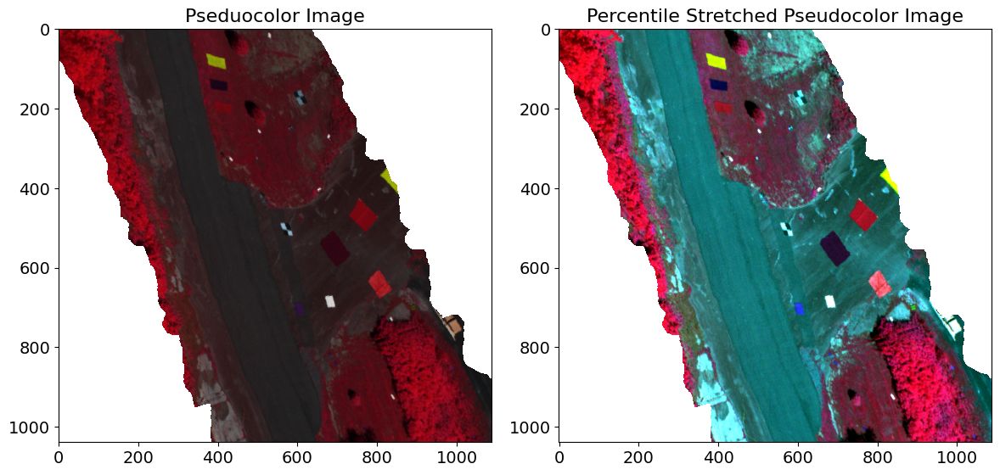

In [107]:
## e. Plotting the pseudocolor (Green, Red, NIR) Image 

# stack the bands
pseudocolor_image = np.dstack([nir_band, red_band, green_band])

# Percentile Stretched Psedoimage
stretched_pseudocolor_image = np.zeros_like(pseudocolor_image, dtype=np.float32)
for i in range(3):  
    stretched_pseudocolor_image[:, :, i] = percentile_stretch(pseudocolor_image[:, :, i])

# Plot the original Pseudocolor image and Percentile Stretched Pseudocolor Image
fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(pseudocolor_image)
axes[0].set_title("Pseduocolor Image")
axes[1].imshow(stretched_pseudocolor_image)
axes[1].set_title("Percentile Stretched Pseudocolor Image")
plt.tight_layout()
plt.show()

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

**COMMENTS:**  

Figure above shows the CIR (colored infrared) version of given hyperspectral image. We can see that since the reflectance of vegetation in infrared region in very high, almost all the vegetation pixels are highlighted with red color. Such plot can be used to visually assess the vegetation areas in the image and to some extent infer the health of vegetation.
</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---
**(1.b) (10 points)** 
Compute and display the correlation matrix as an image (from the previous homework). Analyze the correlation between spectral bands—what patterns do you observe? How are the bands related to each other?  

**Solution:**  
Put your solution here    

---

</div>

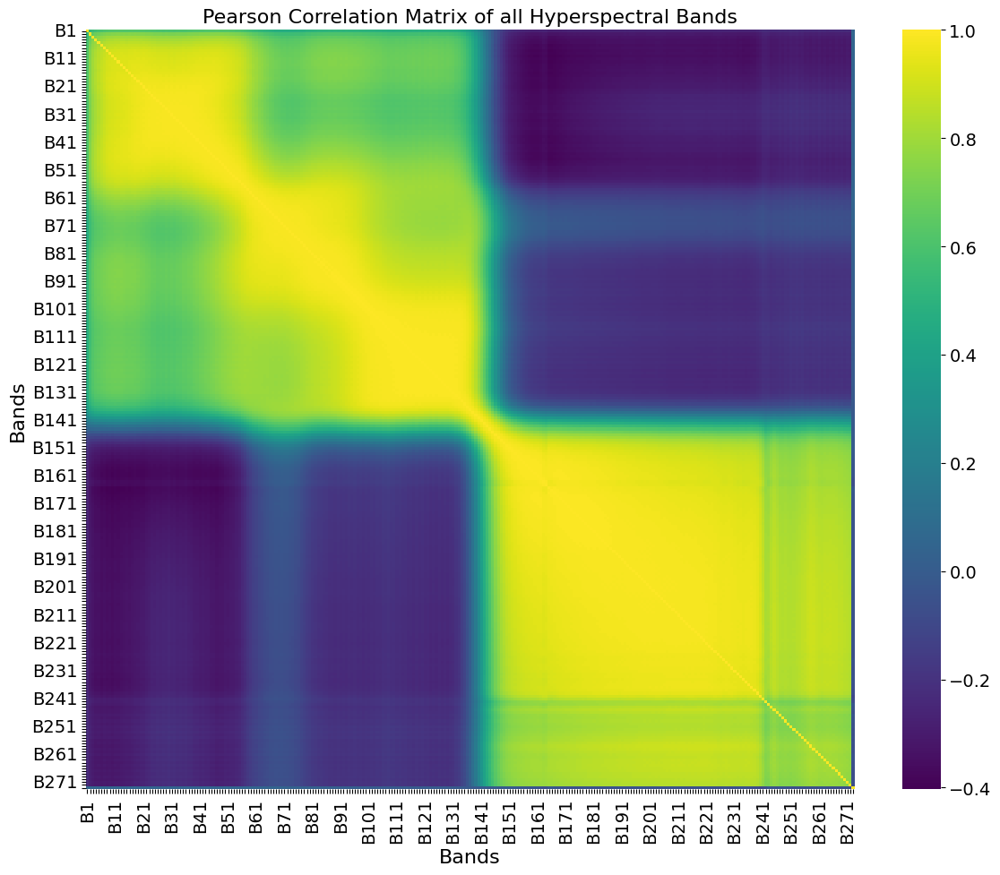

In [108]:
## Plot the correlation Matrix

def correlation_matrix(band_data):

    bands = band_data.shape[2]
    reshaped_data = band_data.reshape(-1, bands) 
    reshaped_data = reshaped_data[~np.isnan(reshaped_data).any(axis=1)]  
    corr_matrix = np.corrcoef(reshaped_data, rowvar=False)

    return corr_matrix

# Compute the correlation matrix for HSI data data
correlation_matrix = correlation_matrix(hsi_filtered)

# Add ticks at certain spacing for better visuals
xticks = [f'B{i+1}' for i in range(hsi_filtered.shape[2])]
step = max(1, len(xticks) // 25)  # Show labels at intervals
xticks_labels = [xticks[i] if i % step == 0 else "" for i in range(len(xticks))]

# Plot the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, fmt=".2f", cmap="viridis", cbar=True,
            xticklabels=xticks_labels, yticklabels=xticks_labels)
plt.title("Pearson Correlation Matrix of all Hyperspectral Bands")
plt.xlabel("Bands")
plt.ylabel("Bands")
plt.tight_layout()
plt.show()


<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

**COMMENTS:**  

The correlation image (matrix) shown above shows the strength of correlation between individual bands in the hyperspectral imagery. We can clearly see the cluster of high correlation bands in the plot. Specially the bands within range *B1-B150* and *B150-B173* show high degree of correlation. Also within these two clusters of high correlation there are clusters of highly correlated band *(corr > 90%)*, for example B1-B60. Such highly correlated bands represent redundant information in the data and the data can be reduced to include lower number of bands for designing efficient machine learning model.
</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---
---

### **Problem 2: Principal Component Analysis (PCA)**  

Principal Component Analysis (PCA) is often explained using eigendecomposition of the covariance matrix. However, due to finite-precision arithmetic, this approach can be numerically unstable on a computer. Instead, in practice, Singular Value Decomposition (SVD) is used to compute PCA more robustly.  

**(2.a) (10 points)**  
Write a function that takes an array of size *m × d*, where *m* is the number of samples and *d* is the number of features. Your function should return:  
1) All principal components as an array  
2) Eigenvalues  
3) Standardized data  

Notes:  
- Mean-centering your data prior to passing it to SVD should be enough, as the data is of a certain bit and in physical units. However, for features across different units and scales, perform standardization (mean-centering + dividing by standard deviation).  
- Mean-centering should be done on each feature separately.  
- Do not use a library for PCA computation, but you may use one for SVD.  
- Ensure eigenvalues and eigenvectors are sorted.  
- Provide sufficient explanation in your code.  

```python  
pcs, eigenvalues, mean_arr = principal_component_analysis(array)  
```
---  

</div>

In [109]:
## Function to compute Principal components from given hyperspectral data:

def principal_component_analysis(array):

    """
    Here, array is the flattened image i.e if the original image size is m * n * k, `array` would be of size : (m*n = samples, k = bands)
    """

    # Mean centering the array across all bands 
    array = (array - np.mean(array, axis=0))

    # using SVD to find U, S and V (eigen vectors) matrices.
    U, S, VT = np.linalg.svd(array, full_matrices=False)

    # Principal components
    pcs = VT.T

    # Eigen values
    eigen_values = (S**2)/(array.shape[0] - 1)
    
    return pcs, eigen_values, array

    

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---

**(2.b) (10 points)**  
Using PCA as a dimensionality reduction technique, apply PCA to the provided hyperspectral dataset.  
- Extract the first 10 principal components.  
- Transform the data into this lower-dimensional space.  
- Reshape the observation dimension to match the image dimensions.  
- Plot the transformed data.  

Discussion:  
Describe your observations—what patterns or features do you notice? Discuss what each principal component represents in the context of hyperspectral data.  

---  

</div>

In [110]:
## a. Applying PCA for dimensionality reduction:

## Get image shape and flatten it.

m, n, d = hsi_filtered.shape 
flattened_hsi_data = hsi_filtered.reshape(m * n, d)

# Mask NaN pixels (keep only valid pixels) for pca analysis since NaN pixels wont contribute to anything in the data (just the spatial structure)
valid_mask = ~np.isnan(flattened_hsi_data).any(axis=1) 
valid_data = flattened_hsi_data[valid_mask]

# Apply PCA on valid data and get pcs, eigen values and mean_centered_array
pcs, eigen_values, mean_centered_data = principal_component_analysis(valid_data)


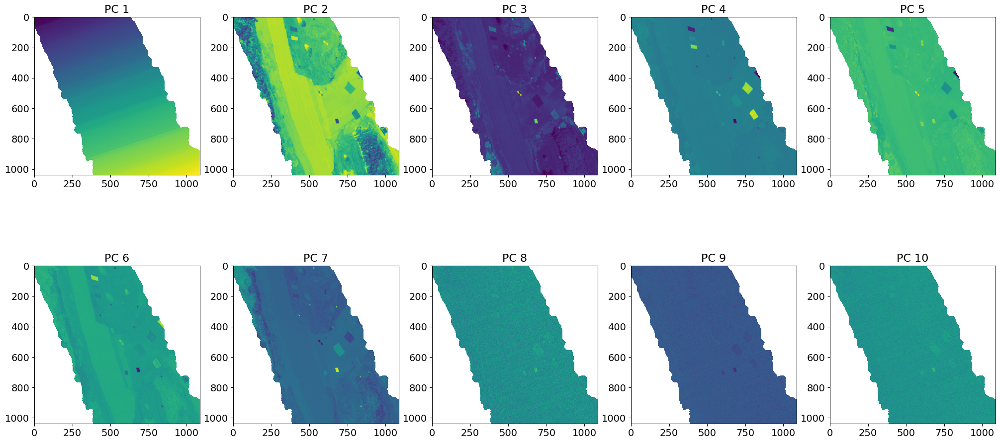

In [111]:
## b. Extract first 10 Principal components and use them to convert data into lower dimensions (PC dimensions)

num_components = 10
first_10pcs = pcs[:, :num_components]
PC_transformed_data = np.dot(mean_centered_data, first_10pcs)

# Plot the PCs with preservation of the spatial structure i.e. including NAN pixels too
pcs_data = np.full((m * n, num_components), np.nan)  # Initialize PC bands with NaNs
pcs_data[valid_mask] = PC_transformed_data  # Insert transformed values back

# Reshape into (m, n, d) format
pcs_image = pcs_data.reshape(m, n, num_components)

# Plot the first 10 PC images
fig, axes = plt.subplots(2, 5, figsize=(20, 10), constrained_layout=True)
for i, ax in enumerate(axes.flat):
    ax.imshow(pcs_image[:, :, i], cmap='viridis')
    ax.set_title(f'PC {i+1}')
plt.show()

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    

The plot for 10 PC transformed data is shown above. From the plots we can see that PC1 (which represent highest variance) contains changes in elevations (topography). In other words highest variation in our data is due to elevation differences in the imagery. Its quite interesting to see that using PCA on HSI data we can get information about topographical variations in the scene. Similarly, second PCA (PC2) highlights road area, PC3 is almost same as green band image (visually), PC4 highlights blue targets, PC5 and PC6 dont really show much variations, PC7 highlights vegetation to some extent and after that the bands get noisy. So from visual inspection we can say that after band 4 there is not much data variance information in the bands.

</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---

**(2.c) (10 points)**  
On the same hyperspectral dataset, plot the mean reconstruction error using the L2 distance between the mean-centered and reconstructed data as a function of the number of principal components.  

Given the large size of the dataset, compute and visualize the error for selected numbers of principal components: 1, 10, 50, 100, and *d* (total number of features).  

---  

</div>

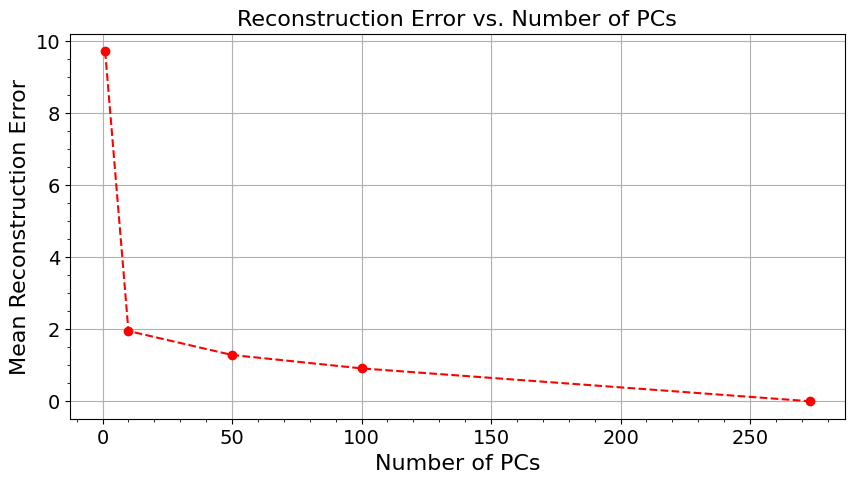

In [112]:
## Determining the reconstruction error after selecting 1, 10, 50, 100 and all 273 PC bands.

# Project the data into all PCs
Z = np.dot(mean_centered_data, pcs)  

# For different PCs compute the reconstruction error as the L2-distance between actual data and reconstructed data
num_components = [1, 10, 50, 100, d]  # PC bands to be tested
errors = []

for k in num_components:

    P_k = pcs[:, :k]  # Take first k principal components
    Z_k = Z[:, :k]  # Project data onto k PCs
    X_hat_k = np.dot(Z_k, P_k.T)  # Reconstruct data

    # L2 norm as Error
    error = np.mean(np.linalg.norm(mean_centered_data - X_hat_k, axis=1))
    errors.append(error)

# Plot the error
plt.figure(figsize=(10, 5))
plt.plot(num_components, errors, marker='o', linestyle='--', color='r')
plt.xlabel("Number of PCs")
plt.ylabel("Mean Reconstruction Error")
plt.title("Reconstruction Error vs. Number of PCs")
plt.minorticks_on()
plt.grid(True)
plt.show()

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    

As we saw from visual analysis there was not much variation in latter bands (after 5 bands), we could also see the same from this plot. The reconstruction error drops significantly by using just the few PC bands. The addition of later bands dont improve much and we get perfect reconstruction (Error = 0) when we take whole 273 bands for reconstruction. Thus we can capture large portion of information of original data by using just few pc bands. We can use this feature of PCA to use significantly fewer bands for ML modelling than using whole 273 HSI data. Also most of the later bands are just *noise* so sometimes even excluding them makes our ML model more efficient and robust.
</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---

**(2.d) (10 points)**  
Lower eigenvalues primarily capture noise rather than meaningful variability. This property can be leveraged to reduce noise in high-dimensional data.  

Using the eigenvalues and their corresponding principal components:  
- Compute the explained variance ratio for each principal component (eigenvalue of a principal component divided by the sum of all eigenvalues).  
- Retain the principal components that collectively explain 99% of the total variance, and set the remaining components to zero.  
- Apply the inverse principal component transformation to reconstruct the data using the modified *d × d* principal component matrix.  

Important:  
No principal components are removed—only their contributions in the eigenvector space are manipulated.  

- Select five interesting pixels from your image and compare their spectral signals before and after transformation.  
- Plot these spectral signals, making sure to name the materials you picked.  
- Additionally, calculate and report the signal-to-noise ratio (SNR)  

$SNR = \frac{\mu}{\sigma}$ 

before and after the transformation for the entire image, ensuring no-data pixels are masked.

---

</div>

In [113]:
## a. Computing the PCs that contribute to 99% variance

# Explained variance ratio calculation for all eigen vectors
ev_ratio = eigen_values / np.sum(eigen_values)
cum_variance = np.cumsum(ev_ratio)

# Extract the PCs that explaine 99% variance
num_retained_pcs = np.argmax(cum_variance >= 0.99) + 1

print(f'Number of PCs required to explain 99% variance = {num_retained_pcs}')

Number of PCs required to explain 99% variance = 1


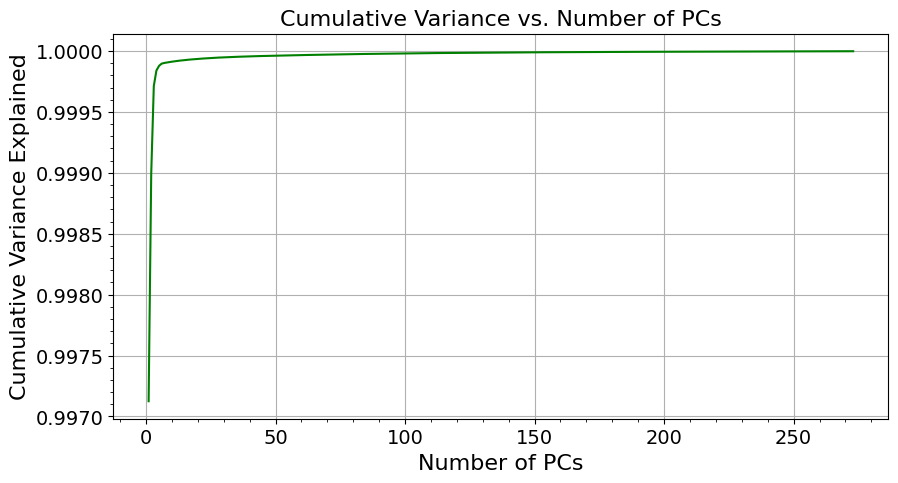

In [114]:
## b. Plotting the cumulative variance explained

plt.figure(figsize=(10, 5))
plt.plot([i+1 for i in range(len(cum_variance))], cum_variance, color='g')
plt.xlabel("Number of PCs")
plt.ylabel("Cumulative Variance Explained")
plt.title("Cumulative Variance vs. Number of PCs")
plt.minorticks_on()
plt.grid(True)
plt.show()


In [115]:
## Use just the retained PC for reconstruction while setting others contribution to zero.
# num_retained_pcs = 5

# Create a modified (dxd) PC matrix with retained PCs
new_pcs = np.zeros_like(pcs)
new_pcs[:, :num_retained_pcs] = pcs[:, :num_retained_pcs]  # Retain first k PCs

# Project the mean-centered data onto the new PC space
reduced_PC_data = np.dot(mean_centered_data, new_pcs)  

# Reconstruct the data from the reduced PC space---> Inverse PCA
original_space_data = np.dot(reduced_PC_data, new_pcs.T) + np.mean(valid_data, axis=0)  # **Add mean back**

# Now reshape into the original spatial structure
org_space_data = np.full((m * n, d), np.nan)  # Initialize NaN array
org_space_data[valid_mask] = original_space_data  # Fill with reconstructed values
org_image = org_space_data.reshape(m, n, d)  # Reshape into (m, n, d)

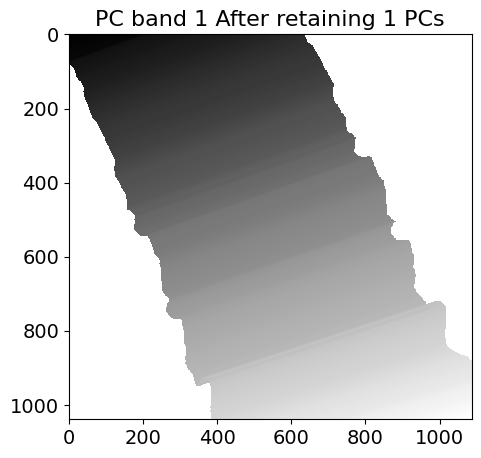

In [116]:
## Plotting the PC projected Data:

pc_space_data = np.full((m * n, d), np.nan)  # Initialize NaN array
pc_space_data[valid_mask] = reduced_PC_data  # Fill with reconstructed values
pc_image = pc_space_data.reshape(m, n, d)  # Reshape into (m, n, d)
pc_band_idx = 0

# Plot first pc
plt.figure(figsize=(10, 5))
plt.imshow(pc_image[:,:,pc_band_idx], cmap='gray')
plt.title(f'PC band {pc_band_idx+1} After retaining {num_retained_pcs} PCs')
plt.show()

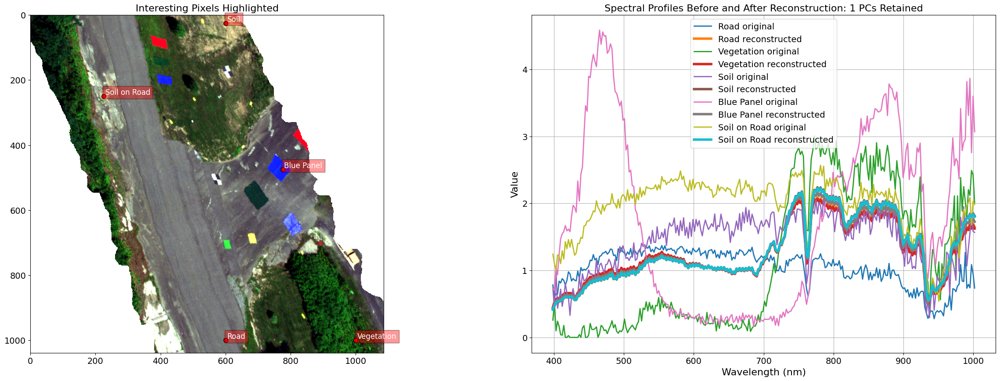

In [117]:
# Select five interesting pixels for visualization

interesting_pixels = [[1000, 600], [1000, 1000], [25, 600], [475, 775], [250, 225]]
labels = ["Road", "Vegetation", "Soil", "Blue Panel", "Soil on Road"]

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

# Display the RGB image and highlight interesting pixels
axes[0].imshow(stretched_rgb)
axes[0].set_title('Interesting Pixels Highlighted')

# Highlight the selected pixels with labels
for (x, y), label in zip(interesting_pixels, labels):
    axes[0].scatter(y, x, c='red', s=50, edgecolors='black')
    axes[0].text(y + 5, x - 5, label, fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.4))

# Plot spectral profiles before and after reconstruction for all interesting pixels
for (x, y), label in zip(interesting_pixels, labels):
    axes[1].plot(wavelengths[:272], hsi_array[x, y, :272], label=f'{label} original', linestyle='solid', linewidth=2)  # Original spectrum
    axes[1].plot(wavelengths[:272], org_image[x, y, :272], label=f'{label} reconstructed', linestyle='solid', linewidth=4)  # Reconstructed spectrum

# Set plot properties
axes[1].set_title(f'Spectral Profiles Before and After Reconstruction: {num_retained_pcs} PCs Retained')
axes[1].set_xlabel('Wavelength (nm)')
axes[1].set_ylabel('Value')
axes[1].legend()
axes[1].grid(True)
plt.show()

In [118]:
## SNR Before and After Transformation:

mean_before = np.nanmean(hsi_array)
std_before = np.nanstd(hsi_array)

mean_after = np.nanmean(org_image)
std_after = np.nanstd(org_image)

snr_before = mean_before / std_before
snr_after = mean_after / std_after

print(f'SNR Before Transformation is: {snr_before} and\nSNR After Transformation is: {snr_after}')

SNR Before Transformation is: 0.06450410187244415 and
SNR After Transformation is: 0.08033058057573618


<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    

Analysing the explained variance we saw that even single PC explains more than 99% of variance in the original data. Even though PC1 captures 99% of the variance, when we take interesting pixels in the imagery reconstructed by using just that PC, we see that all those pixels have spectrum similar to the average of the original data. So we can contend that PC1 capture average spectral information in all bands which caused maximum variation in the data. However, this single PC is not able to capture the subtle difference in the spectral information of different pixels and targets in the imagery. When more PCs included (around 5), the reconstruction improves and we could say *noiseless* version of the spectral difference clearly (shown below).

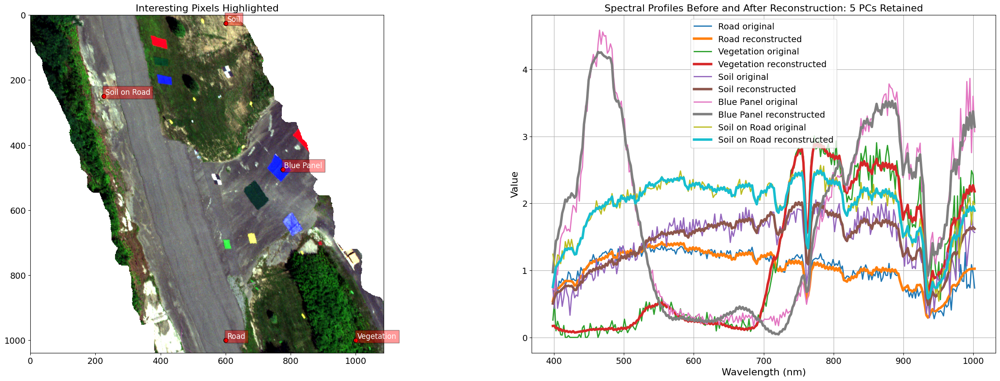

Also the SNR improvement from 0.0645 to 0.08033 can be obtained using just 1 PC and hence we can use few PC bands to obtain noiseless data and improve SNR in the data.

</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---

**(2.BONUS)(10 points)** 

Implement the concept of impact plot discussed in Peter Bajorski’s
book provided as optional reading material in Week 2. Visualize how variability changes
relative to the mean signal for the first five principal components in terms of positive and
negative impacts.
file: week2 statistics for Imaging Optics and Photon.pdf, Section 7.2.3

**Solution:**
Put your solution here

---

</div>

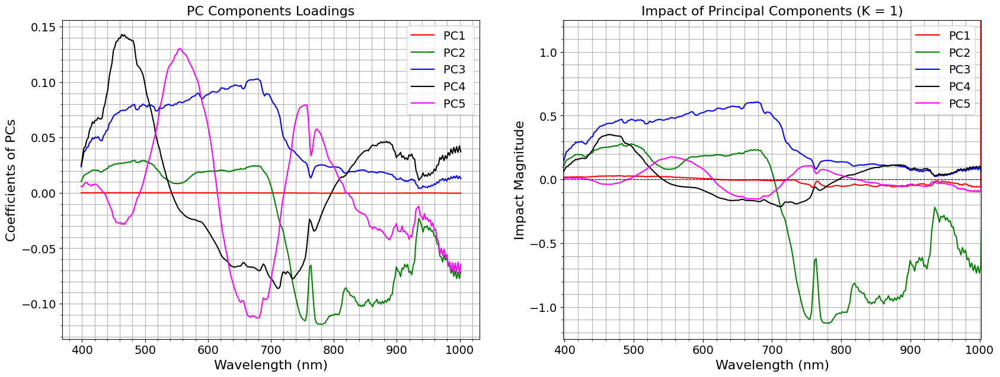

In [119]:
## Creating figures for PC loadings and Impact plot for 5 components

fig, axes = plt.subplots(1, 2, figsize=(20, 7))
colors = ['red','green','blue', 'black','magenta']

# Visualizing Loadings  of 5 PC Components 

ax = axes[0] 
for pc_idx in range(5):
    ax.plot(wavelengths[:272], pcs[:272, pc_idx], label=f'PC{pc_idx+1} ', color=f'{colors[pc_idx]}')

ax.grid(which='both')
ax.minorticks_on()
ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Coefficients of PCs')
ax.set_title('PC Components Loadings')
ax.legend()

# Impact Plot for First Five Principal Components 

ax = axes[1]  
for pc_idx in range(5):

    impact_curve = np.sqrt(eigen_values[pc_idx]) * pcs[:, pc_idx]  # Impact formulation--from reference source (k=1)
    ax.plot(wavelengths, impact_curve, label=f'PC{pc_idx + 1}', color=f'{colors[pc_idx]}')


ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8)  # Zero line
ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Impact Magnitude')
ax.grid(which='both')
ax.minorticks_on()
ax.set_ylim(-1.25, 1.25)
plt.xlim(np.min(wavelengths), np.max(wavelengths)-2)
ax.set_title('Impact of Principal Components (K = 1)')
ax.legend()

plt.show()

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    

The first figure above shows the loadings of first five PCs and the second one shows the *impact plots*. The impact plot for a PC measures the change in a observation vector **x** due to change in the PC. The change in mean vector can be plotted using the *impact curve*:

$$
x - \hat{x} = K \sqrt{\lambda_i}*e_i
$$

we used *K=1* i.e changing PC by *1 standard deviation* for plotting the impact plots for 5 PCs. The position of mean is represented by a dotted line at zero level. Since the PC1 impact is approximately horizontal, the PC1 is proportional to average over all spectral bands and represents the movement of spectra by same amount in all bands. Similarly in PC2, bands below 700nm have small positive impact value and bands above it have a large negative impact value, meaning that PC2 explains small and positive variablility below 700nm and a large dominant negative variability in latter bands. PC3 will have large impact till *VIS* region and lower impact after that. Here *large impact* means *greater variability explained*. And for band 4 and 5 the impact is like *sinusoidal* across the bands. Thus impact plots can help us to understand the variablility of which spectral range (and by how much) is explained by each principal components.

</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---

### Problem 3: K-Means Clustering

**(3.a) (15 points)**  
We discussed K-Means clustering as an unsupervised clustering technique in class. Implement K-Means from scratch **without using a library**. Below is a pseudo code:

1. Initialize K cluster centers  
2. Iterate until convergence or max number of iterations; new cluster centers will not change.  
   - Assign each point's class to the Nearest Centroid  
   - Compute new cluster centroids  

Keep in mind that K-Means calculates L2 distance across dimensions and iteratively updates cluster centers to the mean of assigned points. Since L2 distance is sensitive to scale, make sure to standardize your data before applying K-Means.  

To debug your approach, use the provided test image `jellybeans.tiff`, which is smaller and easier to analyze. Based on the colors in the image, what is an appropriate choice for \( K \)?  

**Solution:**  
Put your solution here  

---
 
</div>

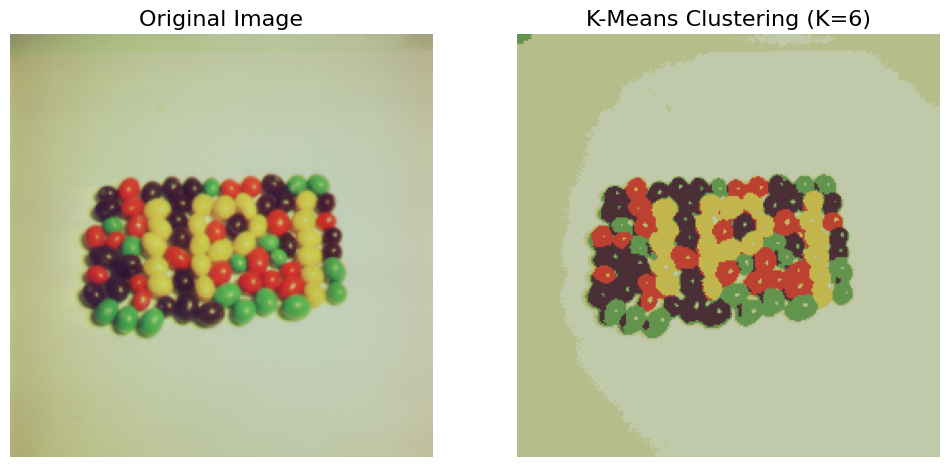

In [131]:
## K-means Clustering Algorithm

import rasterio

def kmeans(X, K, max_iters=500, tol=1e-4):

    np.random.seed(42)  
    centroids = X[np.random.choice(X.shape[0], K, replace=False)]
    
    for _ in range(max_iters):

        # Compute L2 distances and assign clusters
        L2_distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis=2)  
        sample_labels = np.argmin(L2_distances, axis=1)

        # Compute new centroids
        new_centroids = np.array([X[sample_labels == k].mean(axis=0) for k in range(K)])

        # Check for convergence
        if np.linalg.norm(new_centroids - centroids) < tol:
            break
        centroids = new_centroids

    return sample_labels, centroids


## Testing in `jellybeans.tiff` image
with rasterio.open('./materials/jellybeans.tiff') as src:
    image = src.read()  # Reads image in (Channels, Height, Width) format

img = np.transpose(image, (1, 2, 0)) # (Height, Width, Channel format), similar to HSI data
h, w, c = img.shape

# Reshape to (m, d) format, where m = pixels, d = 3 (RGB)
img_reshaped = img.reshape(-1, 3)

# Data Standarization
image_standardized = (img_reshaped - np.mean(img_reshaped, axis=0)) / np.std(img_reshaped, axis=0)

## Running for K=6, since it gave me good clustering
K = 6
labels, centroids = kmeans(image_standardized, K)
clustered_image = centroids[labels]  
clustered_image = clustered_image * np.std(img_reshaped, axis=0) + np.mean(img_reshaped, axis=0) 
clustered_image = np.clip(clustered_image, 0, 255).astype(np.uint8) ## clipping the values to [0, 255] range

## Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(img)  
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(clustered_image.reshape(h, w, c))  
axes[1].set_title(f'K-Means Clustering (K={K})')
axes[1].axis('off')
plt.show()

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    

The simple code for K-means clustering is shown in figure above. For K = 6 my algorithm was able to give good clustering outcome based on visual comparison. Ideally K = 4 should have worked since there are 4 colors of *jellybeans* in the image. However due to the background and lighting difference across the image K = 6 produce good clustering result (4 for beans and 2 for background). This comes as one of the disadvantages of the K-means algorithm for clustering where we have to manually choose the number of clusters before applying the algorithm.
 
</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---

**(3.b) (15 points)**  
In this exercise, we will use the Sentinel-2 data from Assignment 1. The provided Sentinel-2 dataset has 12 spectral bands, but L2 distance in high-dimensional spaces (many features) can become less meaningful. This raises the question of which features should be used for unsupervised clustering?  

One approach is to select specific bands relevant to the clusters of interest based on our application. Another approach is to use PCA as a feature extraction technique.  

- Apply PCA to the Sentinel-2 data using your PCA function.  
- Extract the first 3, 4, 5, and 6 principal components and transform the data into these lower-dimensional representations.  
- Apply your K-Means clustering algorithm to the transformed data.  

**Solution:**  
Put your solution here  

---

In [121]:
## Load Sentinel-2 data

Sen2_roc = np.load('../EDA/sentinel2_rochester.npy')
Sen2_roc[Sen2_roc == 0] = np.nan  # Set no-data values to NaN

# Reshape the image into 2D (pixels, bands)
h, w, d = Sen2_roc.shape
sen_flattened = Sen2_roc.reshape(h * w, d)

# Extract valid pixels (non-NaN)
valid_mask = ~np.isnan(sen_flattened).any(axis=1)
valid_data = sen_flattened[valid_mask]

# Apply PCA
eigen_vectors, eigen_values, mean_centered_data = principal_component_analysis(valid_data)

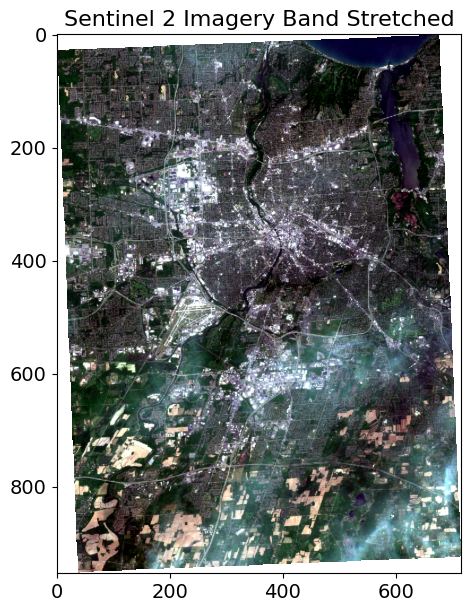

In [142]:
# Plot the Sentinel-2 rgb image

sen_img = np.dstack([Sen2_roc[:, :,3], Sen2_roc[:, :, 2], Sen2_roc[:, :, 1]]) 
stretched_sen_img = np.zeros_like(sen_img, dtype=np.float32)
for i in range(3):  
    stretched_sen_img[:, :, i] = percentile_stretch(sen_img[:, :, i])

plt.figure(figsize=(15, 7))
plt.imshow(stretched_sen_img)
plt.title(f'Sentinel 2 Imagery Band Stretched')
plt.show()

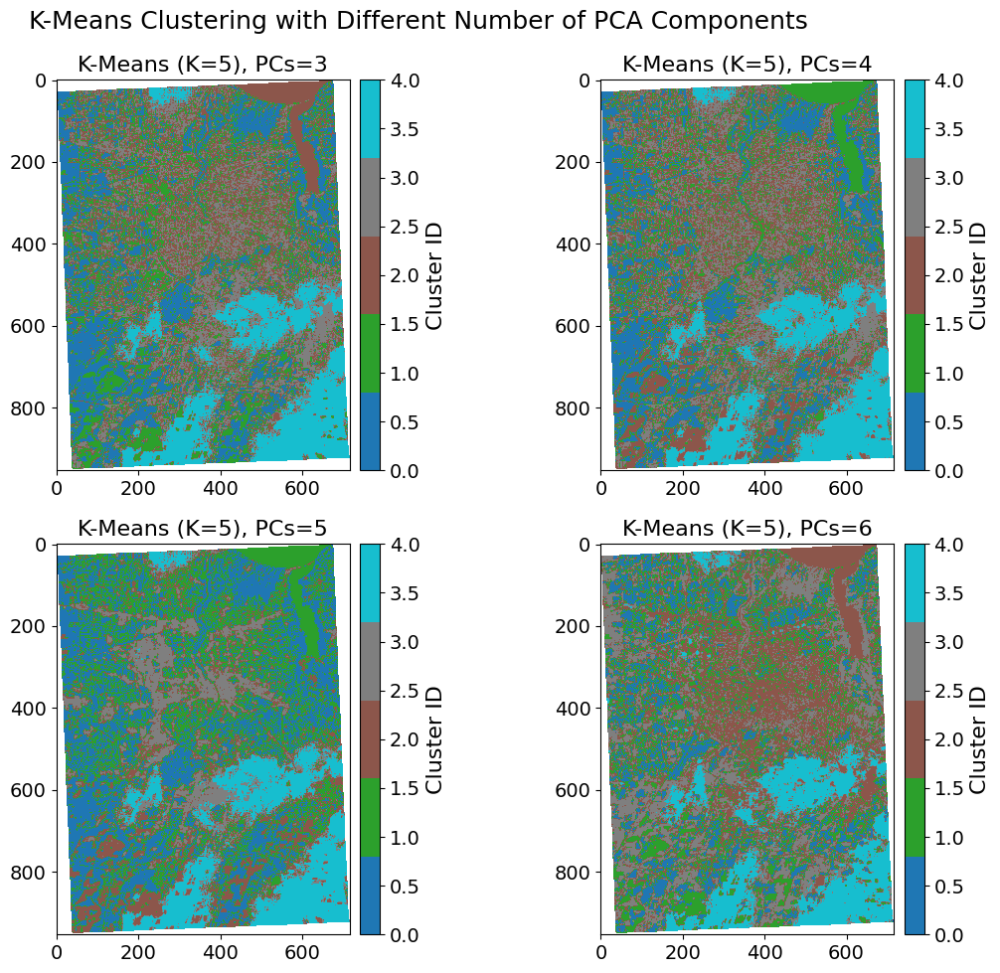

In [122]:
## Running for all PC componenst

num_pcs_list = [3, 4, 5, 6]  

K = 5  # Number of clusters

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for i, num_pcs in enumerate(num_pcs_list):
    
    # Select first `num_pcs` principal components
    transformed_data = np.dot(mean_centered_data, eigen_vectors[:, :num_pcs])

    # Standardize data
    standard_transformed_data = (transformed_data - np.mean(transformed_data, axis=0)) / np.std(transformed_data, axis=0)

    # Apply K-means clustering
    labels, centroids = kmeans(standard_transformed_data, K)

    # Assign cluster values back to spatial structure
    clustered_data = np.full((h * w,), np.nan)
    clustered_data[valid_mask] = labels
    clustered_image = clustered_data.reshape(h, w)

    # Plot in 2x2 subplot
    ax = axes[i // 2, i % 2]
    cmap = plt.get_cmap('tab10', K)
    im = ax.imshow(clustered_image, cmap=cmap)
    ax.set_title(f'K-Means (K={K}), PCs={num_pcs}')
    cbar = fig.colorbar(im, ax=ax, fraction=0.05, pad=0.02)
    cbar.set_label('Cluster ID')

plt.suptitle('K-Means Clustering with Different Number of PCA Components')
plt.tight_layout()
plt.show()


<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    


</div>

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">

---

**(3.c) (10 points)**  
Now that you have used PCA for feature extraction and K-Means for clustering, we will apply the same workflow to hyperspectral data from Problem 2. In this case, we have hundreds of bands, making feature selection non-trivial. Additionally, since this dataset is much larger in terms of the number of samples, K-Means will be computationally expensive due to repeated distance calculations. To improve efficiency, use MiniBatch K-Means from the `sklearn` library, which speeds up clustering for datasets of large sizes.  

For this problem:  
- Extract a (250 x 250) patch from the hyperspectral dataset that includes calibration panels, roads, and vegetation (regions with variability).  
- Perform dimensionality reduction using PCA, transforming the data to 2, 5, 10, 50, and 100 features.  
- Apply K-Means clustering to both the lower-dimensional data and the original dataset (all bands).  
- Report and compare your results. How does performance change with different numbers of features?  

**Solution:**  
Put your solution here 

---
</div>

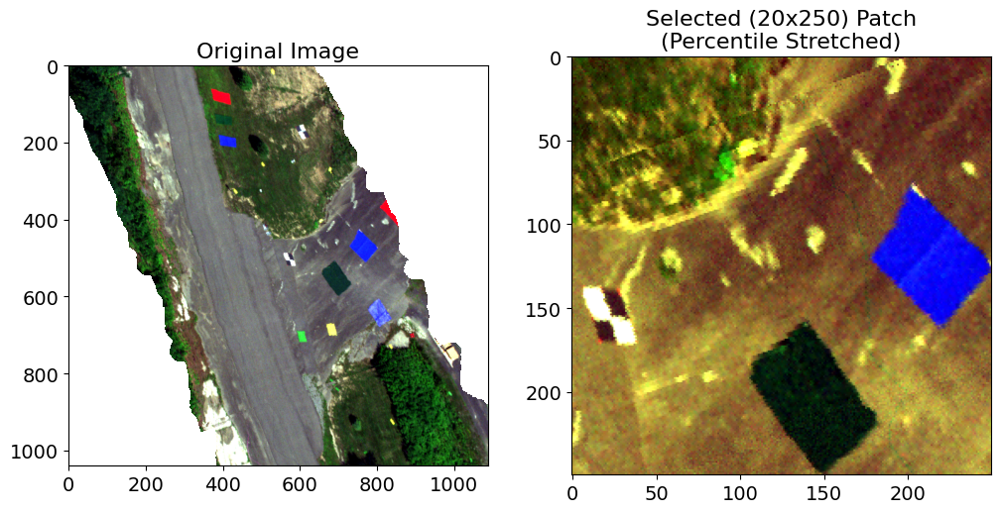

In [123]:
## a. Selecting a 250x250 subset from hsi data:

hsi_subset = hsi_array[350:600, 550:800,: ]
rgb_subset = np.dstack([hsi_subset[:, :, red_idx], hsi_subset[:, :,green_idx], hsi_subset[:, :,blue_idx]]) 

stretched_rgb_subset = np.zeros_like(rgb_subset, dtype=np.float32)
for i in range(3):  
    stretched_rgb_subset[:, :, i] = percentile_stretch(rgb_subset[:, :, i])

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(stretched_rgb)  
axes[0].set_title('Original Image')
axes[1].imshow(stretched_rgb_subset)  
axes[1].set_title(f'Selected (20x250) Patch\n(Percentile Stretched)')
plt.show()



<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    


</div>

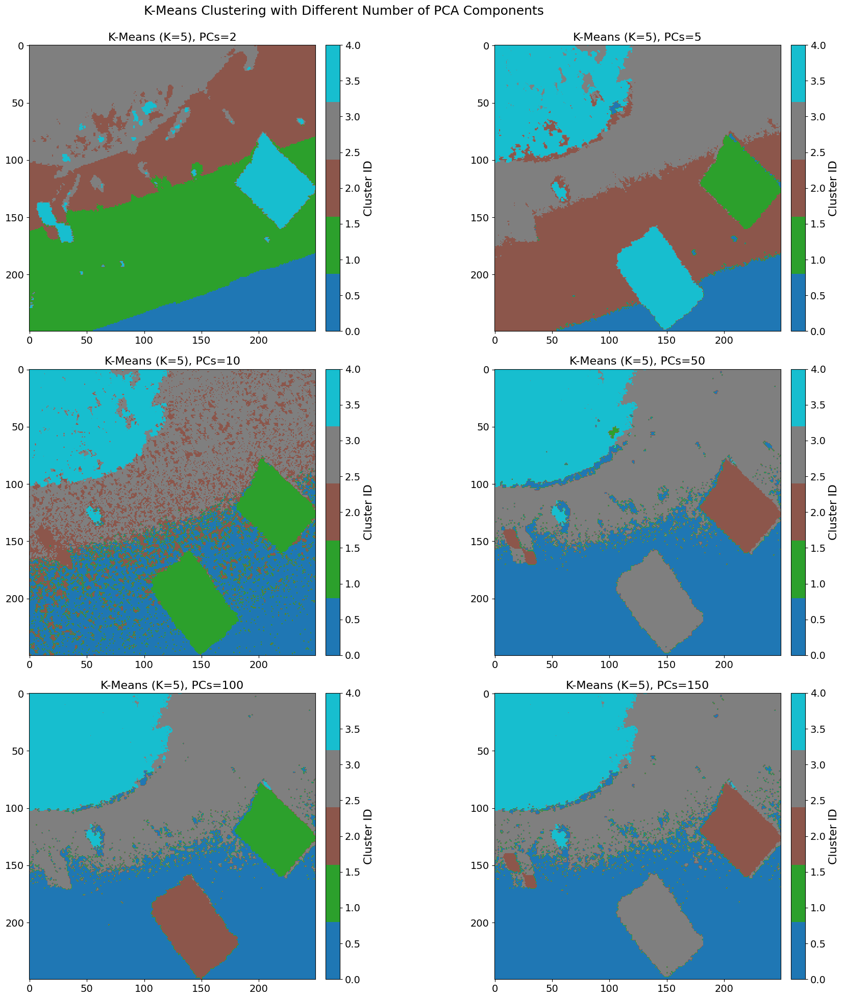

In [124]:
## b. Dimensionality Reduction using PCA and clustering:

hsi_subset_flattened = hsi_subset.reshape(hsi_subset.shape[0]*hsi_subset.shape[1], hsi_subset.shape[2])

# Apply PCA
pcs_subset, evals_subset, mcd_subset = principal_component_analysis(hsi_subset_flattened)

## Running for all PC componenst

num_pcs_list_sub = [2, 5, 10, 50, 100, 150]  

K = 5  # Number of clusters

fig, axes = plt.subplots(3, 2, figsize=(20, 20))

for i, num_pcs in enumerate(num_pcs_list_sub):
    
    # Select first `num_pcs` principal components
    transformed_data_subset = np.dot(mcd_subset, pcs_subset[:, :num_pcs])

    # Standardize data
    standard_transformed_data_subset = (transformed_data_subset - np.mean(transformed_data_subset, axis=0)) / np.std(transformed_data_subset, axis=0)

    # Apply K-means clustering
    labels, centroids = kmeans(standard_transformed_data_subset, K)

    # Assign cluster values back to spatial structure
    clustered_data = np.full((hsi_subset.shape[0] * hsi_subset.shape[1]), np.nan)
    clustered_data = labels
    clustered_image = clustered_data.reshape(hsi_subset.shape[0], hsi_subset.shape[1])

    # Plot in 3x2 subplot
    ax = axes[i // 2, i % 2]
    cmap = plt.get_cmap('tab10', K)
    im = ax.imshow(clustered_image, cmap=cmap)
    ax.set_title(f'K-Means (K={K}), PCs={num_pcs}')
    cbar = fig.colorbar(im, ax=ax, fraction=0.05, pad=0.02)
    cbar.set_label('Cluster ID')

plt.suptitle('K-Means Clustering with Different Number of PCA Components\n')
plt.tight_layout()
plt.show()

<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    


</div>

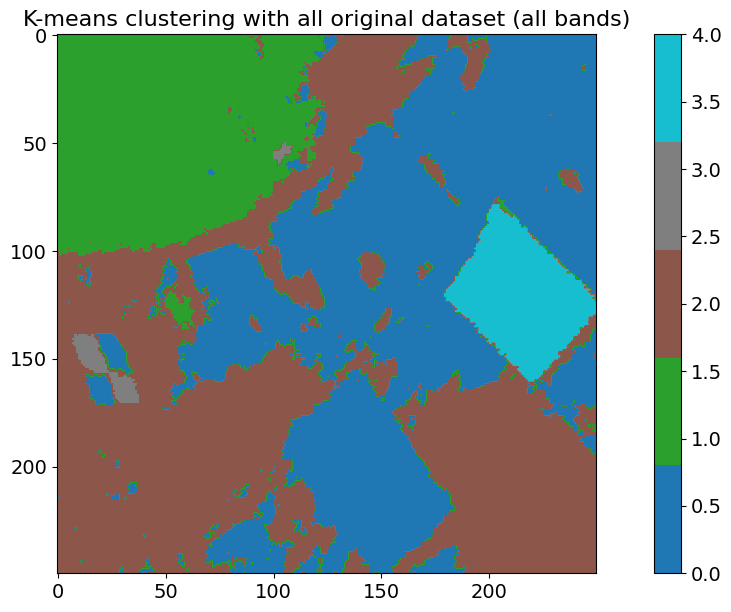

In [125]:
## b. Applying clustering to original dataset (all bands):

all_band_data = hsi_subset_flattened
standarized_all_band_data = (all_band_data - np.mean(all_band_data, axis=0)) / np.std(all_band_data, axis=0)

# Apply k-means clutering:

K = 5 ## 5 clusters
all_band_labels, all_band_centroids = kmeans(standarized_all_band_data, K)

# Assign cluster values back to spatial structure
clustered_data_all_bands = np.full((hsi_subset.shape[0] * hsi_subset.shape[1]), np.nan)
clustered_data_all_bands = all_band_labels
clustered_image_all_bands = clustered_data_all_bands.reshape(hsi_subset.shape[0], hsi_subset.shape[1])

# Plot the clustered image
plt.figure(figsize=(15, 7))
cmap = plt.get_cmap('tab10', K)
plt.imshow(clustered_image_all_bands, cmap=cmap)
plt.title(f'K-means clustering with all original dataset (all bands)')
plt.colorbar()
plt.show()


<div style="font-family: 'TeX Gyre Termes', serif; color: black; font-size: 18px;">


**COMMENTS:**    


</div>